In [1]:
import pandas as pd 
import numpy as np 
import matplotlib
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

In [2]:
df = pd.read_csv("covid_vaccine_statewise.csv")
df

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4584,15/05/2021,West Bengal,8955081.0,265500.0,1535.0,8955081.0,3717988.0,4820673.0,4133379.0,1029.0,1395568.0,11277501.0,1034.0,293620.0,839189.0,4023691.0,3797563.0,12673069
4585,16/05/2021,West Bengal,8958736.0,72268.0,365.0,8958736.0,3719913.0,4823003.0,4134704.0,1029.0,1396978.0,11281671.0,1034.0,294191.0,840550.0,4024905.0,3798066.0,12678649
4586,17/05/2021,West Bengal,9001376.0,379622.0,1730.0,9001376.0,3739934.0,4851954.0,4148384.0,1038.0,1421802.0,11319508.0,1036.0,298717.0,852961.0,4043894.0,3804758.0,12741310
4587,18/05/2021,West Bengal,9046876.0,295766.0,1313.0,9046876.0,3758465.0,4882518.0,4163312.0,1046.0,1445968.0,11359373.0,1037.0,303860.0,864675.0,4064819.0,3812446.0,12805341


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4589 entries, 0 to 4588
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Updated On                           4589 non-null   object 
 1   State                                4589 non-null   object 
 2   Total Individuals Vaccinated         4551 non-null   float64
 3   Total Sessions Conducted             4551 non-null   float64
 4   Total Sites                          4551 non-null   float64
 5   First Dose Administered              4551 non-null   float64
 6   Second Dose Administered             4551 non-null   float64
 7   Male(Individuals Vaccinated)         4551 non-null   float64
 8   Female(Individuals Vaccinated)       4551 non-null   float64
 9   Transgender(Individuals Vaccinated)  4551 non-null   float64
 10  Total Covaxin Administered           4551 non-null   float64
 11  Total CoviShield Administered 

### In Data Analysis We will Analyze To Find out the below stuff ###
### 1. Missing Values ###
### 2. All The Numerical Variables ###
### 3. Distribution of the Numerical Variables ###
### 4. Categorical Variables ###
### 5. Outliers ###
### 6. Relationship between independent and dependent feature

# 1. Misiing Values

In [4]:
features_with_na = [features for features in df.columns if df[features].isnull().sum() > 1] #list comprehension to identify null values in Data frame

for feature in features_with_na:
    print(feature, np.round(df[feature].isnull().mean() * 100, 4),  ' % missing values')

Total Individuals Vaccinated 0.8281  % missing values
Total Sessions Conducted 0.8281  % missing values
Total Sites  0.8281  % missing values
First Dose Administered 0.8281  % missing values
Second Dose Administered 0.8281  % missing values
Male(Individuals Vaccinated) 0.8281  % missing values
Female(Individuals Vaccinated) 0.8281  % missing values
Transgender(Individuals Vaccinated) 0.8281  % missing values
Total Covaxin Administered 0.8281  % missing values
Total CoviShield Administered 0.8281  % missing values
AEFI 48.3983  % missing values
18-30 years (Age) 48.3983  % missing values
30-45 years (Age) 48.3983  % missing values
45-60 years (Age) 48.3983  % missing values
60+ years (Age) 48.3983  % missing values


In [5]:
df.shape

(4589, 18)

In [6]:
data = df.copy()
data.head(10)

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280
5,21/01/2021,India,365965.0,32226.0,12600.0,365965.0,0.0,132784.0,233143.0,38.0,5367.0,360598.0,NaN,NaN,NaN,NaN,NaN,365965
6,22/01/2021,India,549381.0,36988.0,14115.0,549381.0,0.0,193899.0,355402.0,80.0,8128.0,541253.0,NaN,NaN,NaN,NaN,NaN,549381
7,23/01/2021,India,759008.0,43076.0,15605.0,759008.0,0.0,267856.0,491049.0,103.0,11192.0,747816.0,NaN,NaN,NaN,NaN,NaN,759008
8,24/01/2021,India,835058.0,49851.0,18111.0,835058.0,0.0,296283.0,538647.0,128.0,13156.0,821902.0,NaN,NaN,NaN,NaN,NaN,835058
9,25/01/2021,India,1277104.0,55151.0,19682.0,1277104.0,0.0,444137.0,832766.0,201.0,18858.0,1258246.0,NaN,NaN,NaN,NaN,NaN,1277104


In [7]:
data.head(10)

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280
5,21/01/2021,India,365965.0,32226.0,12600.0,365965.0,0.0,132784.0,233143.0,38.0,5367.0,360598.0,NaN,NaN,NaN,NaN,NaN,365965
6,22/01/2021,India,549381.0,36988.0,14115.0,549381.0,0.0,193899.0,355402.0,80.0,8128.0,541253.0,NaN,NaN,NaN,NaN,NaN,549381
7,23/01/2021,India,759008.0,43076.0,15605.0,759008.0,0.0,267856.0,491049.0,103.0,11192.0,747816.0,NaN,NaN,NaN,NaN,NaN,759008
8,24/01/2021,India,835058.0,49851.0,18111.0,835058.0,0.0,296283.0,538647.0,128.0,13156.0,821902.0,NaN,NaN,NaN,NaN,NaN,835058
9,25/01/2021,India,1277104.0,55151.0,19682.0,1277104.0,0.0,444137.0,832766.0,201.0,18858.0,1258246.0,NaN,NaN,NaN,NaN,NaN,1277104


In [8]:
data.fillna(0) # We won't be deleteing any data, replacing all NA values with 0 

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,0.0,0.0,0.0,0.0,0.0,48276
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,0.0,0.0,0.0,0.0,0.0,58604
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,0.0,0.0,0.0,0.0,0.0,99449
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,0.0,0.0,0.0,0.0,0.0,195525
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,0.0,0.0,0.0,0.0,0.0,251280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4584,15/05/2021,West Bengal,8955081.0,265500.0,1535.0,8955081.0,3717988.0,4820673.0,4133379.0,1029.0,1395568.0,11277501.0,1034.0,293620.0,839189.0,4023691.0,3797563.0,12673069
4585,16/05/2021,West Bengal,8958736.0,72268.0,365.0,8958736.0,3719913.0,4823003.0,4134704.0,1029.0,1396978.0,11281671.0,1034.0,294191.0,840550.0,4024905.0,3798066.0,12678649
4586,17/05/2021,West Bengal,9001376.0,379622.0,1730.0,9001376.0,3739934.0,4851954.0,4148384.0,1038.0,1421802.0,11319508.0,1036.0,298717.0,852961.0,4043894.0,3804758.0,12741310
4587,18/05/2021,West Bengal,9046876.0,295766.0,1313.0,9046876.0,3758465.0,4882518.0,4163312.0,1046.0,1445968.0,11359373.0,1037.0,303860.0,864675.0,4064819.0,3812446.0,12805341


### Converting Date object to Datetime

In [9]:
data['Updated On'] =  pd.to_datetime(data['Updated On'], format="%d/%m/%Y")
data['Updated On'] = data['Updated On'].dt.strftime('%m/%y')
data["Updated On"]

0       01/21
1       01/21
2       01/21
3       01/21
4       01/21
        ...  
4584    05/21
4585    05/21
4586    05/21
4587    05/21
4588    05/21
Name: Updated On, Length: 4589, dtype: object

# ** 2. All The Numerical Variables **

In [10]:
data.shape

(4589, 18)

### As India's Overall Data is alos included, it is cretaing high skewness in data, so we need to remove it. 

In [11]:
data.drop(data.loc[data['State']== "India"].index, inplace=True)



In [12]:
data.head(10)

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
124,01/21,Andaman and Nicobar Islands,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN,NaN,NaN,NaN,NaN,23
125,01/21,Andaman and Nicobar Islands,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN,NaN,NaN,NaN,NaN,23
126,01/21,Andaman and Nicobar Islands,42.0,9.0,2.0,42.0,0.0,29.0,13.0,0.0,0.0,42.0,NaN,NaN,NaN,NaN,NaN,42
127,01/21,Andaman and Nicobar Islands,89.0,12.0,2.0,89.0,0.0,53.0,36.0,0.0,0.0,89.0,NaN,NaN,NaN,NaN,NaN,89
128,01/21,Andaman and Nicobar Islands,124.0,16.0,3.0,124.0,0.0,67.0,57.0,0.0,0.0,124.0,NaN,NaN,NaN,NaN,NaN,124
129,01/21,Andaman and Nicobar Islands,239.0,22.0,6.0,239.0,0.0,110.0,129.0,0.0,0.0,239.0,NaN,NaN,NaN,NaN,NaN,239
130,01/21,Andaman and Nicobar Islands,552.0,29.0,6.0,552.0,0.0,231.0,321.0,0.0,0.0,552.0,NaN,NaN,NaN,NaN,NaN,552
131,01/21,Andaman and Nicobar Islands,920.0,32.0,9.0,920.0,0.0,342.0,578.0,0.0,0.0,920.0,NaN,NaN,NaN,NaN,NaN,920
132,01/21,Andaman and Nicobar Islands,966.0,38.0,9.0,966.0,0.0,357.0,609.0,0.0,0.0,966.0,NaN,NaN,NaN,NaN,NaN,966
133,01/21,Andaman and Nicobar Islands,1519.0,43.0,10.0,1519.0,0.0,447.0,1072.0,0.0,0.0,1519.0,NaN,NaN,NaN,NaN,NaN,1519


In [13]:
numerical_features = [feature for feature in data.columns if data[feature].dtypes != 'O'] # list comprehension feature that are not equal to object type

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
data[numerical_features].head()


Number of numerical variables:  16


,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
124,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN,NaN,NaN,NaN,NaN,23
125,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,NaN,NaN,NaN,NaN,NaN,23
126,42.0,9.0,2.0,42.0,0.0,29.0,13.0,0.0,0.0,42.0,NaN,NaN,NaN,NaN,NaN,42
127,89.0,12.0,2.0,89.0,0.0,53.0,36.0,0.0,0.0,89.0,NaN,NaN,NaN,NaN,NaN,89
128,124.0,16.0,3.0,124.0,0.0,67.0,57.0,0.0,0.0,124.0,NaN,NaN,NaN,NaN,NaN,124


In [14]:
data[numerical_features].fillna(0)

,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,AEFI,18-30 years (Age),30-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
124,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,0.0,0.0,0.0,0.0,0.0,23
125,23.0,2.0,2.0,23.0,0.0,12.0,11.0,0.0,0.0,23.0,0.0,0.0,0.0,0.0,0.0,23
126,42.0,9.0,2.0,42.0,0.0,29.0,13.0,0.0,0.0,42.0,0.0,0.0,0.0,0.0,0.0,42
127,89.0,12.0,2.0,89.0,0.0,53.0,36.0,0.0,0.0,89.0,0.0,0.0,0.0,0.0,0.0,89
128,124.0,16.0,3.0,124.0,0.0,67.0,57.0,0.0,0.0,124.0,0.0,0.0,0.0,0.0,0.0,124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4584,8955081.0,265500.0,1535.0,8955081.0,3717988.0,4820673.0,4133379.0,1029.0,1395568.0,11277501.0,1034.0,293620.0,839189.0,4023691.0,3797563.0,12673069
4585,8958736.0,72268.0,365.0,8958736.0,3719913.0,4823003.0,4134704.0,1029.0,1396978.0,11281671.0,1034.0,294191.0,840550.0,4024905.0,3798066.0,12678649
4586,9001376.0,379622.0,1730.0,9001376.0,3739934.0,4851954.0,4148384.0,1038.0,1421802.0,11319508.0,1036.0,298717.0,852961.0,4043894.0,3804758.0,12741310
4587,9046876.0,295766.0,1313.0,9046876.0,3758465.0,4882518.0,4163312.0,1046.0,1445968.0,11359373.0,1037.0,303860.0,864675.0,4064819.0,3812446.0,12805341


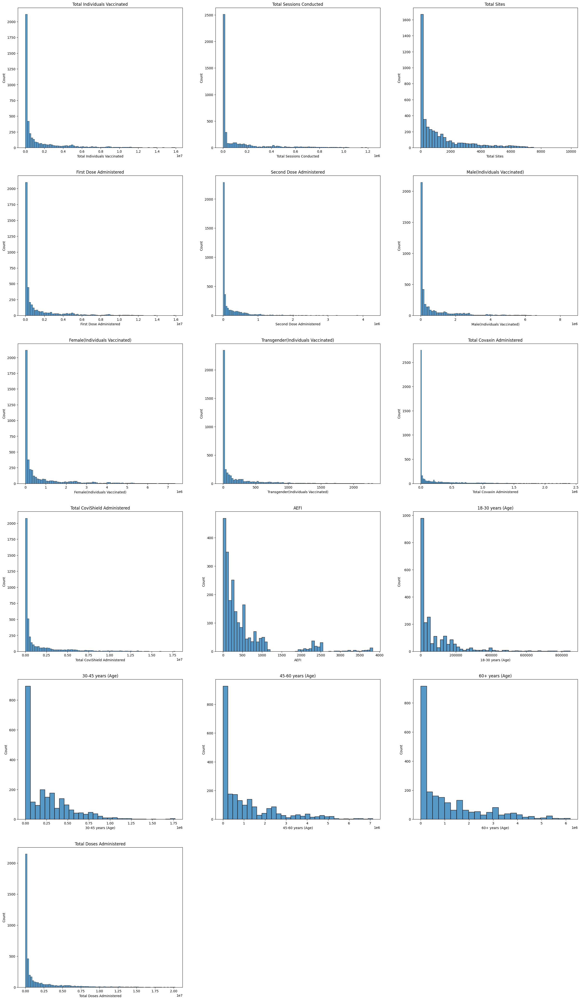

In [15]:
a = 9  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30,80))

for i in numerical_features:
    plt.subplot(a, b, c)
    plt.title('{}'.format(i))

    sns.histplot(data= data, x= i)

    c = c + 1

plt.show()

## *let us check for decreate values*

In [16]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_feature=[feature for feature in numerical_features if len(data[feature].unique())]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 16


### 0 discrete values 

## ** Continous Features **

In [17]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature ]
print("Continuous feature Count {}".format(len(continuous_feature)))



Continuous feature Count 0


### Plotting discrete features against tota individual vaccinated

In [18]:
discrete_feature

['Total Individuals Vaccinated',
 'Total Sessions Conducted',
 'Total Sites ',
 'First Dose Administered',
 'Second Dose Administered',
 'Male(Individuals Vaccinated)',
 'Female(Individuals Vaccinated)',
 'Transgender(Individuals Vaccinated)',
 'Total Covaxin Administered',
 'Total CoviShield Administered',
 'AEFI',
 '18-30 years (Age)',
 '30-45 years (Age)',
 '45-60 years (Age)',
 '60+ years (Age)',
 'Total Doses Administered']

## breaking down Discrete feature list to sub categories for easy of plotting

In [19]:
Covid_dose = ['First Dose Administered','Second Dose Administered']
Vaccinated = [ 'Male(Individuals Vaccinated)','Female(Individuals Vaccinated)','Transgender(Individuals Vaccinated)']
Vaccines_available = ['Total Covaxin Administered','Total CoviShield Administered']
Age = ['18-30 years (Age)','30-45 years (Age)','45-60 years (Age)','60+ years (Age)']

## Bar plot to determine number of covid dose administered State Wise

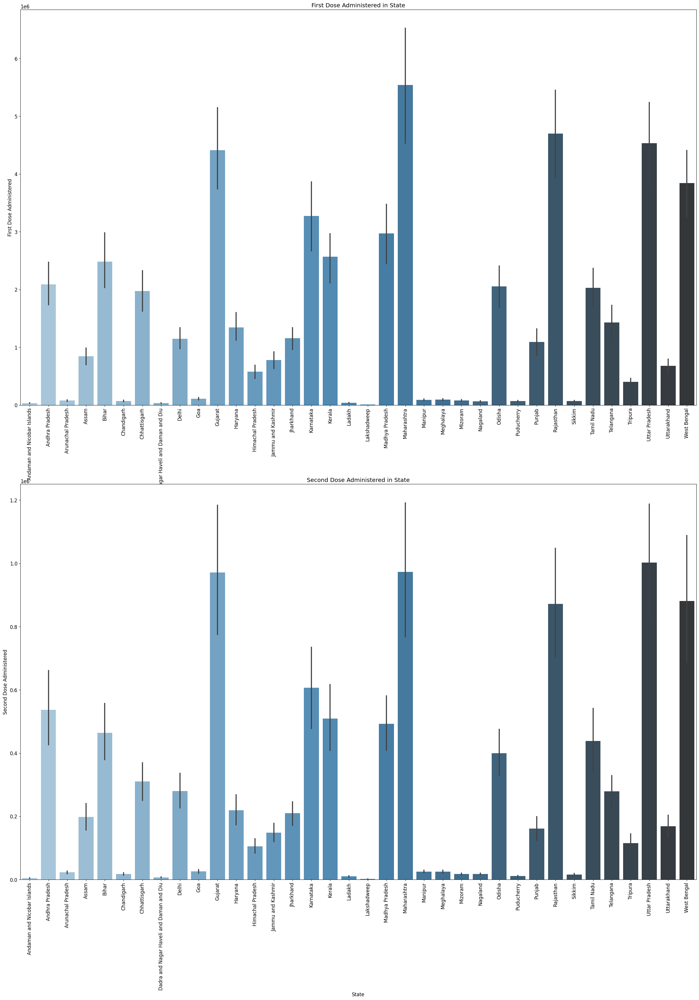

In [20]:
a = 3  # number of rows
b = 1  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30, 60))
font = {'size': 12}
  
# using rc function
plt.rc('font', **font)

for i in Covid_dose:
    plt.subplot(a, b, c)
    plt.title('{} in State'.format(i))
    sns.barplot(x= "State", y=  i, data= data, palette="Blues_d")
    plt.xticks(rotation = 90)
    c = c + 1

plt.show()

## Bar plot to determine number of People Vaccinated State Wise

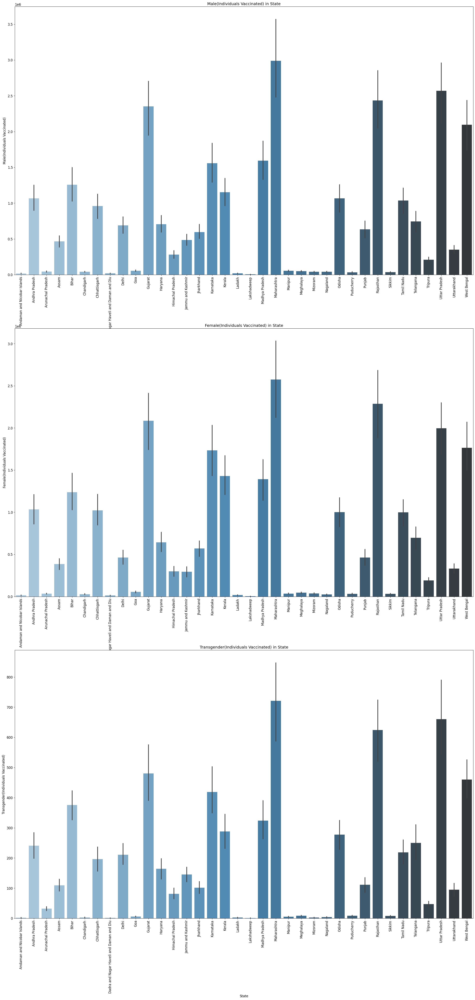

In [21]:
a = 3  # number of rows
b = 1  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30, 60))

for i in Vaccinated:
    plt.subplot(a, b, c)
    plt.title('{} in State'.format(i))
    sns.barplot(x="State", y= i, data= data, palette="Blues_d")
    plt.xticks(rotation = 90)
    c = c + 1

plt.show()

## Scatterplot of individual states to Determine what Vaccines are given among total number of vaccines available. 

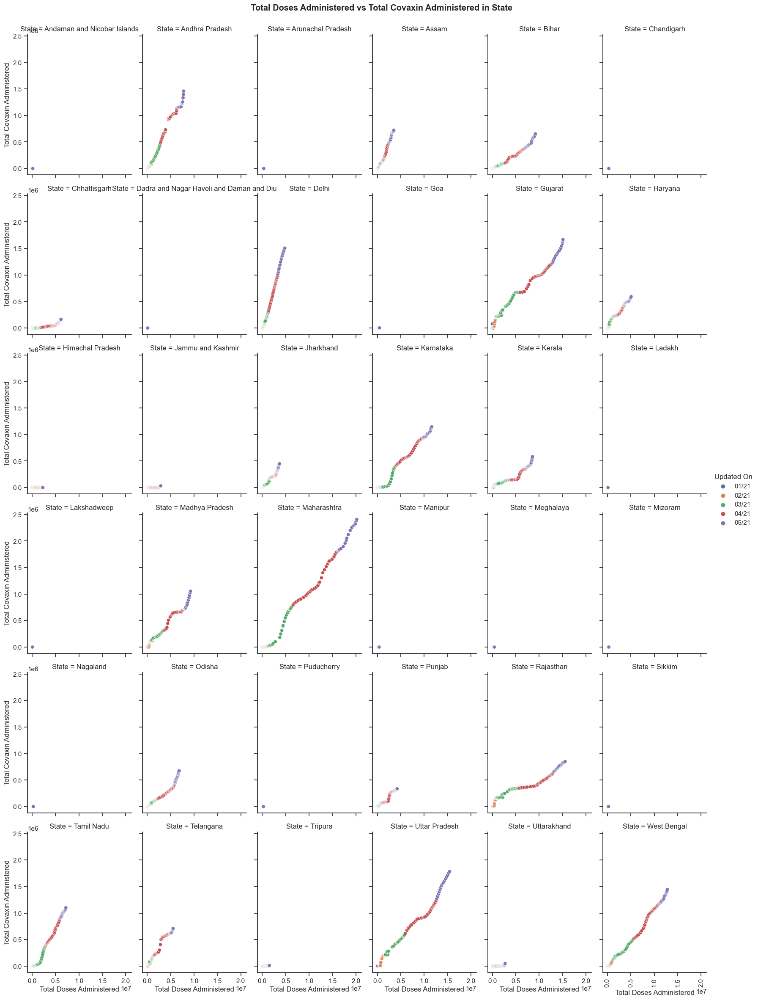

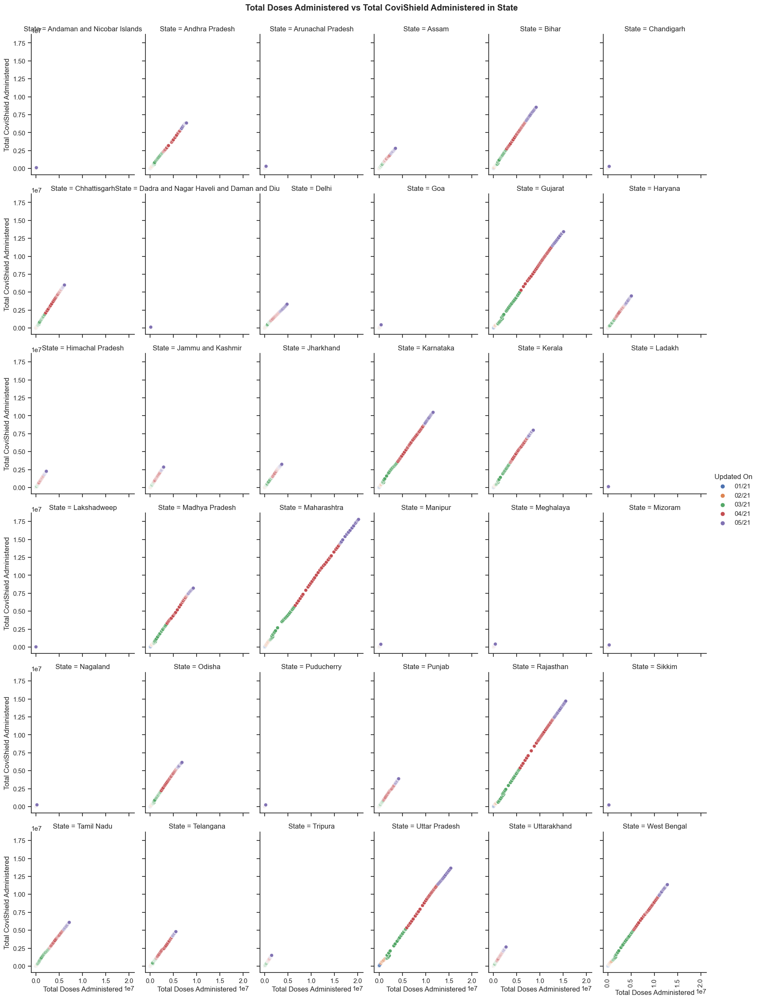

In [22]:
sns.set_theme(style="ticks")
for i in Vaccines_available:
    g = sns.relplot(data=data, x="Total Doses Administered", y=i, hue="Updated On",col= data.State, col_wrap=6 ,height= 4, aspect=.7,kind= "scatter", palette="deep")
    g.fig.suptitle(f" Total Doses Administered vs {i} in State", fontweight ="bold")
    plt.subplots_adjust(top=.95)
    plt.xticks(rotation = 90)
plt.show()

## Scatterplot of individual states to Determine How many indivuals are vacinnated Age Wise in Total Number of Vaccine Sessions conducted 

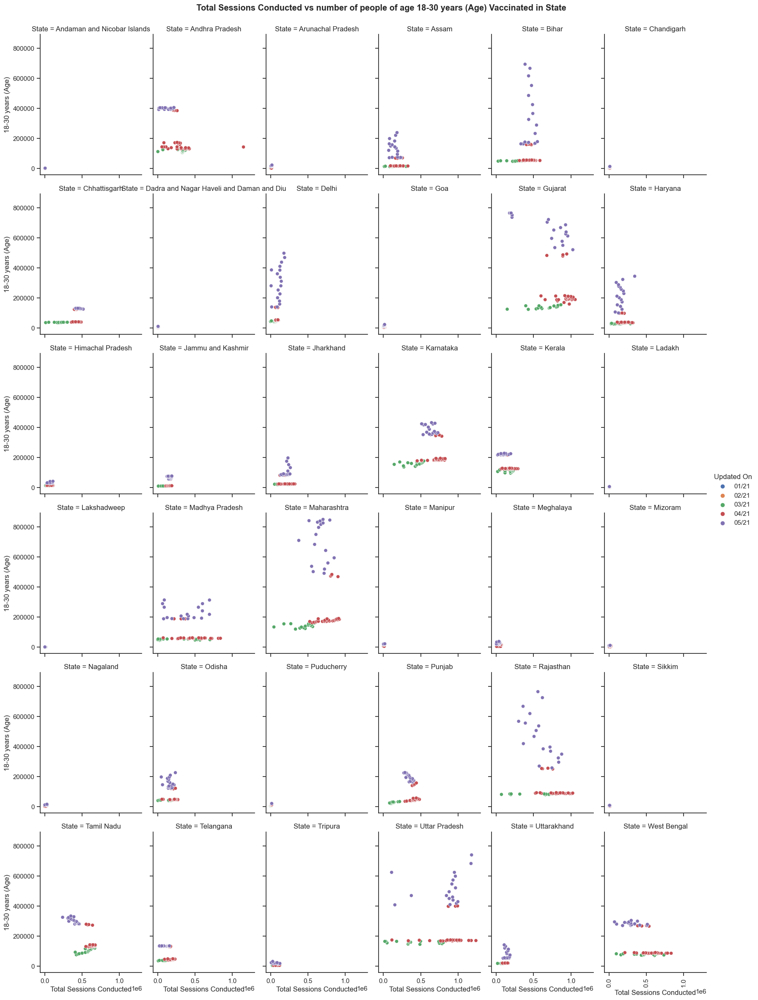

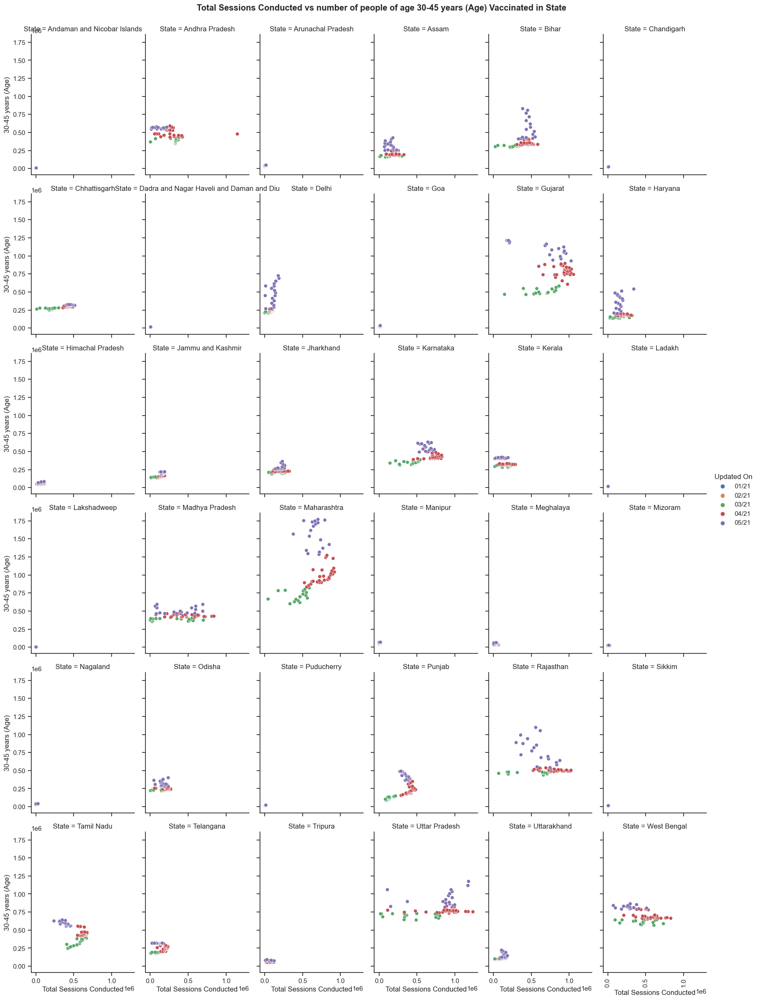

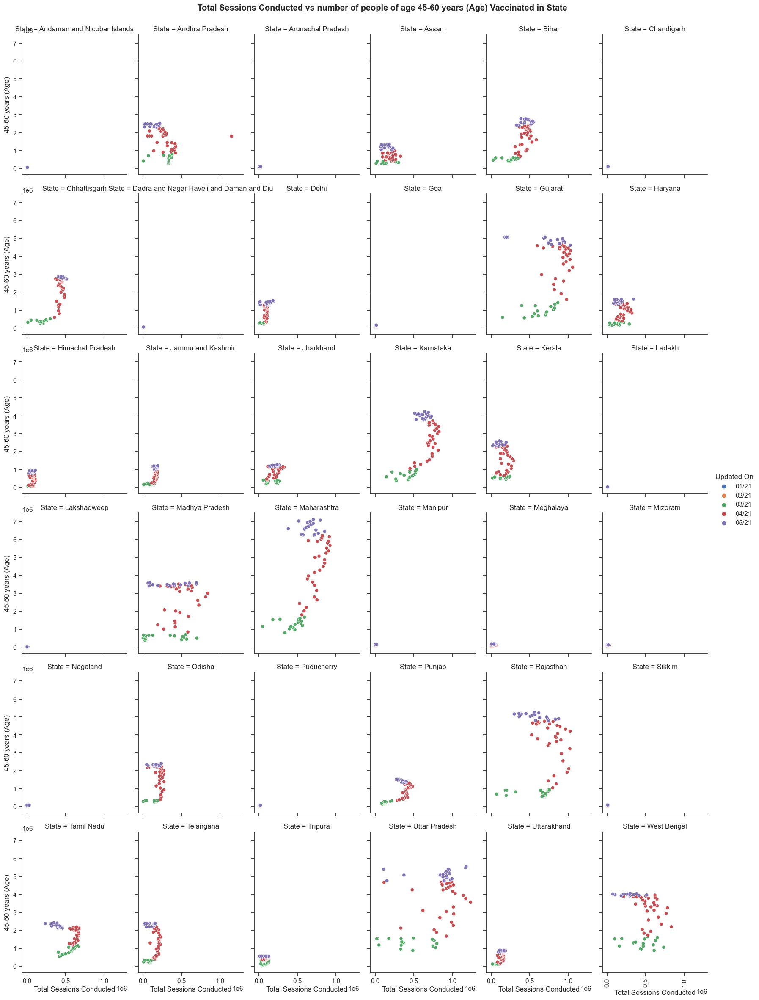

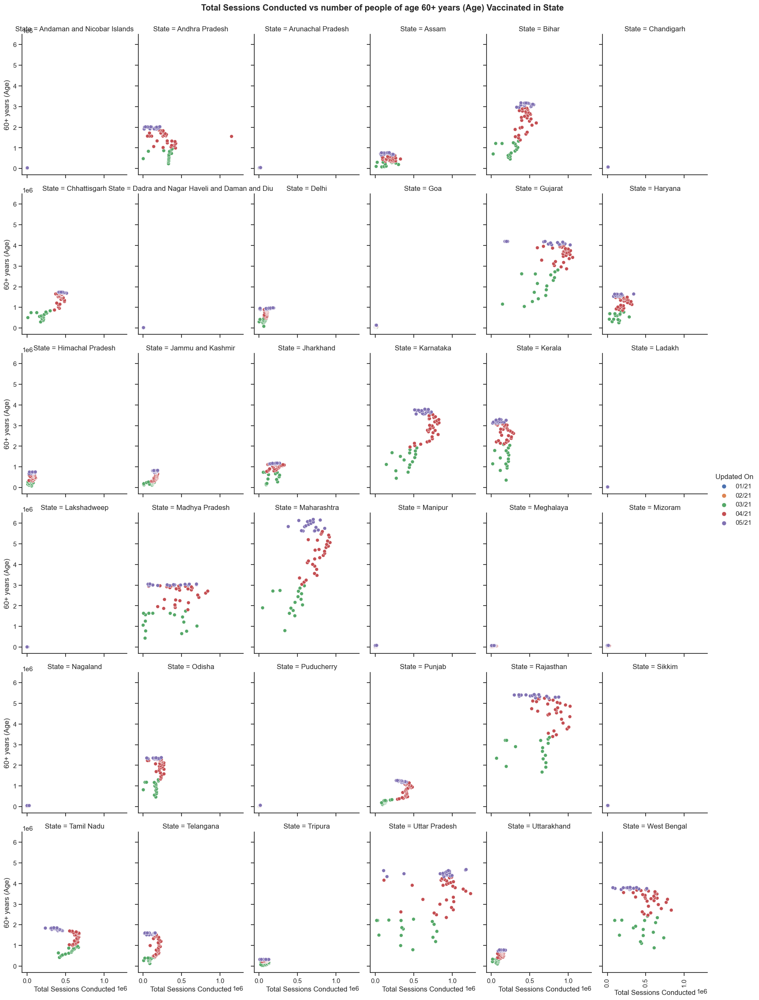

In [23]:
for i in Age:
    g = sns.relplot(data=data, x= data["Total Sessions Conducted"], y=i,col= data.State, col_wrap=6, hue="Updated On", height= 4, aspect=.7,kind="scatter", legend= True, palette="deep")
    g.fig.suptitle(f" Total Sessions Conducted vs number of people of age {i} Vaccinated in State", fontweight ="bold")
    plt.subplots_adjust(top=.95)
    plt.xticks(rotation = 90)
plt.show()

# ** categorical vairables **

In [24]:
categorical_features=[feature for feature in df.columns if df[feature].dtypes=='O']
categorical_features

['Updated On', 'State']

In [25]:
for feature in categorical_features:
    print('The feature is {} and number of categories are {}'.format(feature,len(df[feature].unique())))

The feature is Updated On and number of categories are 125
The feature is State and number of categories are 37


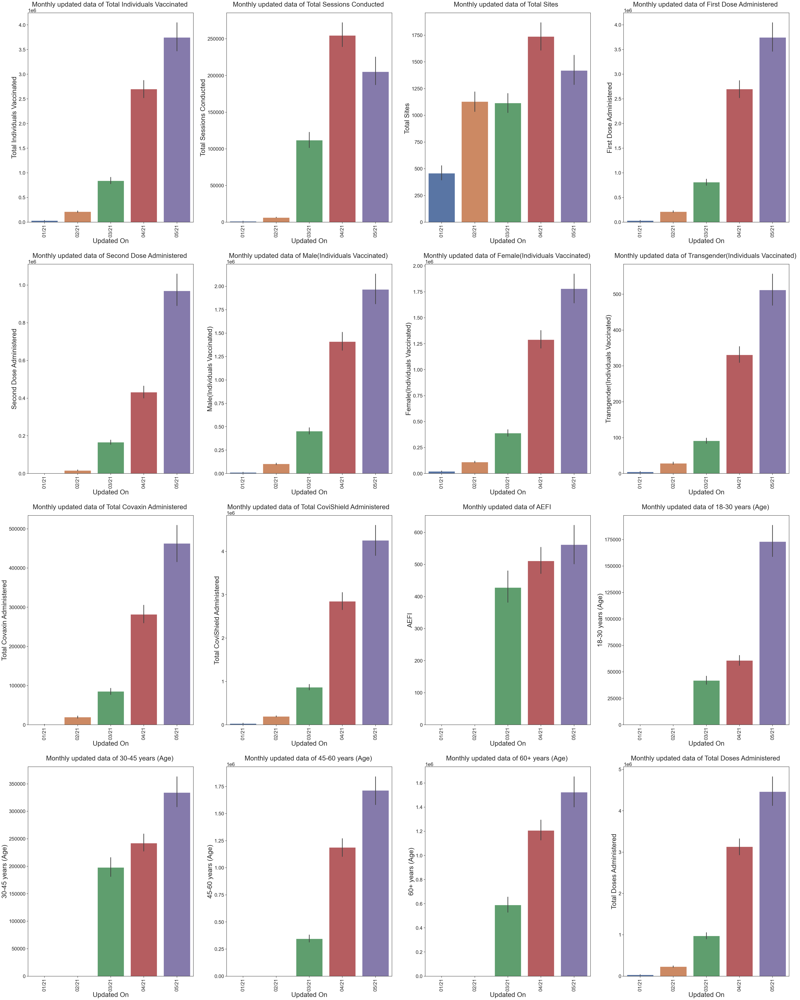

In [26]:
a = 4  # number of rows
b = 4  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(55, 70))
# plt.rcParams.update({'font.size': 25})
size=27
params = {'legend.fontsize': 'large',
          'axes.labelsize': size,
          'axes.titlesize': size,
          'xtick.labelsize': size*0.75,
          'ytick.labelsize': size*0.75,
          'axes.titlepad': 25}
plt.rcParams.update(params)

for i in discrete_feature:
    plt.subplot(a, b, c)
    plt.title('Monthly updated data of {} '.format(i))
    sns.barplot(x=  "Updated On", y=  i, data= data ,palette="deep")
    plt.xticks(rotation = 90)
    c = c + 1

plt.show()

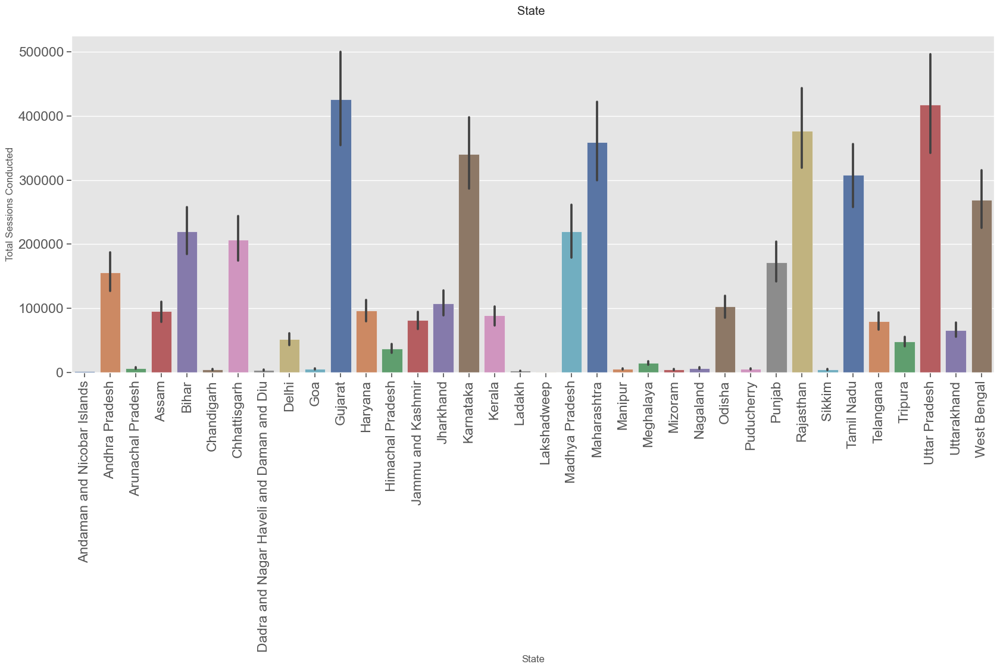

In [27]:
a = 3  # number of rows
b = 1  # number of columns
c = 1  # initialize plot counter

size=22
params = {'legend.fontsize': 'large',
          'axes.labelsize': size,
          'axes.titlesize': size,
          'xtick.labelsize': size*0.75,
          'ytick.labelsize': size*0.75,
          'axes.titlepad': 25}
plt.rcParams.update(params)

fig = plt.figure(figsize=(20, 25))
plt.style.use("ggplot")

for i in categorical_features[1:]:
    plt.subplot(a, b, c)
    plt.title('{} '.format(i))
    sns.barplot(x = data[i], y = data["Total Sessions Conducted"], palette="deep")
    plt.xticks(rotation=90)
    

    c = c + 1

plt.show()